# Run from here

In [2]:
#imports

from gentropy.common.session import Session
from gentropy.dataset.summary_statistics import SummaryStatistics
from pyspark.sql.functions import col
from gentropy.dataset.study_locus import StudyLocus
from gentropy.dataset.study_index import StudyIndex

#create session
session = Session(extended_spark_conf={"spark.driver.memory": "6g"})


Loading BokehJS ...

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


24/06/25 16:09:35 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


### Load study Index

In [3]:
# load study index
path_si="data/index/"
study_index=StudyIndex.from_parquet(session=session, path=path_si)

#### Use Gentropy SL overlap function to find overlap between CSs for using COLOC

In [4]:
from gentropy.dataset.study_locus import StudyLocus, StudyLocusOverlap
from datetime import datetime

#path_cred_sets="gs://genetics_etl_python_playground/releases/24.03/credible_set/finngen_susie"
#local path
path_cred_sets="data/study_locus/"
sl=StudyLocus.from_parquet(session=session,path=path_cred_sets)
study_index=StudyIndex.from_parquet(session=session, path="data/index/")
# print length of study locus
print(sl.df.count())
# Find Overlaps
study_locus_overlap_intra = sl.find_overlaps(study_index, intra_study_overlap=True)
study_locus_overlap_inter = sl.find_overlaps(study_index, intra_study_overlap=False)
study_locus_combined = study_locus_overlap_intra.df.unionByName(study_locus_overlap_inter.df)
print(study_locus_combined)
print(type(study_locus_combined))
date = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
study_locus_combined.write.parquet(f"data/overlaps_{date}/")



13966
24/06/25 16:09:52 WARN CacheManager: Asked to cache already cached data.
DataFrame[leftStudyLocusId: bigint, rightStudyLocusId: bigint, chromosome: string, tagVariantId: string, statistics: struct<left_logBF:double,left_posteriorProbability:double,left_beta:double,left_pValueMantissa:float,left_pValueExponent:int,right_logBF:double,right_posteriorProbability:double,right_beta:double,right_pValueMantissa:float,right_pValueExponent:int>]
<class 'pyspark.sql.dataframe.DataFrame'>


In [5]:
# Count the number of rows in the overlap DataFrame
print(study_locus_overlap_intra.df.show())
print(study_locus_overlap_intra.df.count())
print(study_locus_overlap_inter.df.show())
print(study_locus_overlap_inter.df.count())

+----------------+-----------------+----------+------------+----------+
|leftStudyLocusId|rightStudyLocusId|chromosome|tagVariantId|statistics|
+----------------+-----------------+----------+------------+----------+
+----------------+-----------------+----------+------------+----------+

None


0


+--------------------+--------------------+----------+----------------+--------------------+
|    leftStudyLocusId|   rightStudyLocusId|chromosome|    tagVariantId|          statistics|
+--------------------+--------------------+----------+----------------+--------------------+
|-3544786763432086627|-9215091430977920480|         1| 1_26607100_AC_A|{11.005551205553,...|
|-3544786763432086627|-9215091430977920480|         1|  1_26675220_A_G|{11.8288220892832...|
|-3544786763432086627|-9215091430977920480|         1|  1_26675402_G_A|{11.5844899925472...|
|-3544786763432086627|-9215091430977920480|         1|  1_26676156_T_C|{11.820897830622,...|
|-3544786763432086627|-9215091430977920480|         1|  1_26688257_C_G|{11.6264599364101...|
|-3544786763432086627|-9215091430977920480|         1|  1_26710663_T_G|{11.1957213194904...|
|-3544786763432086627|-9215091430977920480|         1|  1_26724732_A_G|{11.1957213194904...|
|-3544786763432086627|-9215091430977920480|         1|  1_26727525_A_G

4537734


#### Import StudyLocus Overlaps INTER AND INTRA for coloc

In [6]:
study_locus_overlaps = StudyLocusOverlap.from_parquet(session=session, path=f"data/overlaps_{date}/")
# count the number of rows in the overlap DataFrame
print(study_locus_overlaps.df.count())

4537734


#### Colocalisation for SL overlap

In [7]:
from gentropy.method.colocalisation import Coloc
from gentropy.dataset.colocalisation import Colocalisation
import pyspark.sql.functions as F

# 1. Perform Colocalization
coloc_results = Coloc.colocalise(study_locus_overlaps)

print(coloc_results.df.show())

# 2. Analyze Colocalization Results
# Filter for significant colocalization (e.g., using a threshold for PP.H4)
significant_coloc = coloc_results.filter(F.col("h4") > 0.8)

# Print the results
print(significant_coloc.df.show())


+----------+--------------------+--------------------+--------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+------------------+--------------------+
|chromosome|    leftStudyLocusId|   rightStudyLocusId|numberColocalisingVariants|                  h0|                  h1|                  h2|                  h3|                  h4|          log2h4h3|colocalisationMethod|
+----------+--------------------+--------------------+--------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+------------------+--------------------+
|         1|-7739811754326032609|-8580726767903703361|                         9|1.982276920469156...|1.341592281969666...|3.353873509699807...|  0.0217208566430716|  0.9779437558698183|5.4925985869166185|               COLOC|
|         1|-7180920194711895424|-8803538001521518159|                         2|1.445687016

+----------+--------------------+--------------------+--------------------------+--------------------+--------------------+--------------------+--------------------+------------------+------------------+--------------------+
|chromosome|    leftStudyLocusId|   rightStudyLocusId|numberColocalisingVariants|                  h0|                  h1|                  h2|                  h3|                h4|          log2h4h3|colocalisationMethod|
+----------+--------------------+--------------------+--------------------------+--------------------+--------------------+--------------------+--------------------+------------------+------------------+--------------------+
|         1|-7739811754326032609|-8580726767903703361|                         9|1.982276920469156...|1.341592281969666...|3.353873509699807...|  0.0217208566430716|0.9779437558698183|5.4925985869166185|               COLOC|
|         1|-7180920194711895424|-8803538001521518159|                         2|1.445687016280731..

In [8]:
# Running coloc step function for debugging
from gentropy.colocalisation import ColocalisationStep
# coloc = ColocalisationStep(session=session, credible_set_path=path_cred_sets, study_index_path=path_si, coloc_path = f"all_chrs_output", colocalisation_method="Coloc")


from gentropy.dataset.colocalisation import Colocalisation
output_path = "all_chrs_output/coloc/"
coloc_step_results = Colocalisation.from_parquet(session=session,path=output_path)
print(coloc_step_results.df.show())

# Find any matching rows
for row in coloc_step_results.df.collect():
    if row.leftStudyLocusId == row.rightStudyLocusId:
        print(row)

+--------------------+--------------------+----------+--------------------+--------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+------------------+----+
|    leftStudyLocusId|   rightStudyLocusId|chromosome|colocalisationMethod|numberColocalisingVariants|                  h0|                  h1|                  h2|                  h3|                  h4|          log2h4h3|clpp|
+--------------------+--------------------+----------+--------------------+--------------------------+--------------------+--------------------+--------------------+--------------------+--------------------+------------------+----+
|-7739811754326032609|-8580726767903703361|         1|               COLOC|                         9|1.982276920469156...|1.341592281969666...|3.353873509699807...|  0.0217208566430716|  0.9779437558698183|5.4925985869166185|null|
|-7180920194711895424|-8803538001521518159|         1|               COL

In [9]:
print(significant_coloc.df.count())

32429


In [10]:
# Convert pyspark dataframe to pandas dataframe
coloc_pd_df = significant_coloc.df.toPandas()

#write to csv
coloc_pd_df.to_csv("output/coloc_results.csv")


In [11]:
# Chromosome to analyze
chromosomes = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, "X"]

### Method 2
##### Form clusters by looping over most signifcant CS by P-Value.

Method 2 loop - functional

In [12]:
# Create clusters based on p value groups.
# Imports and set variables
from pyspark.sql.functions import col, size

# Create a set to store collected variants for efficient lookup
collected_variants = set()  # variants already seen

# DF for p value variants in CHR
# Filter to keep rows with non-empty traitFromSourceMappedIds
study_index_df = study_index.df
left_joined_df = sl.df.join(study_index_df, on='studyId', how='left')
filtered_df = left_joined_df.filter((col("traitFromSourceMappedIds").isNotNull()) & (size(col("traitFromSourceMappedIds")) > 0))

# study locus and study index combined table - RENAME at some point
left_joined_df = sl.df.join(study_index_df, on='studyId', how='left')
left_joined_df_filtered = left_joined_df.filter((col("traitFromSourceMappedIds").isNotNull()) & (size(col("traitFromSourceMappedIds")) > 0))
# Create a new column for p-value, p-value = pValueMantissa * 10^pValueExponent
left_joined_df_filtered = left_joined_df_filtered.withColumn("p_value", F.col(
    "pValueMantissa") * F.pow(10, F.col("pValueExponent")))
pvalue_ordered_sl_si_df = left_joined_df_filtered.orderBy("p_value")
print(pvalue_ordered_sl_si_df.columns)

#for chr in chromosomes:
#    # Filter the DataFrame for the chromosome of interest
#    chr_df = pvalue_ordered_sl_si_df.filter(F.col("chromosome") == chr)
#    chr_pd_df = chr_df.toPandas()  # convert to pandas dataframe
#    chr_pd_df.head(5)
#    print(f"{len(chr_pd_df)} variants in chromosome {chr}.")
#
#    # save to csv
#    chr_pd_df.to_csv(f"data/processed_data/chr_{chr}_pvalue_ordered.csv")

['studyId', 'studyLocusId', 'variantId', 'chromosome', 'position', 'region', 'beta', 'zScore', 'pValueMantissa', 'pValueExponent', 'effectAlleleFrequencyFromSource', 'standardError', 'subStudyDescription', 'qualityControls', 'finemappingMethod', 'credibleSetIndex', 'credibleSetlog10BF', 'purityMeanR2', 'purityMinR2', 'sampleSize', 'ldSet', 'locus', 'projectId', 'studyType', 'traitFromSource', 'traitFromSourceMappedIds', 'geneId', 'tissueFromSourceId', 'pubmedId', 'publicationTitle', 'publicationFirstAuthor', 'publicationDate', 'publicationJournal', 'backgroundTraitFromSourceMappedIds', 'initialSampleSize', 'nCases', 'nControls', 'nSamples', 'cohorts', 'ldPopulationStructure', 'discoverySamples', 'replicationSamples', 'qualityControls', 'analysisFlags', 'summarystatsLocation', 'hasSumstats', 'p_value']


#### For loop of p-values

In [13]:
# Loop over DF with Pvalues ordered, create clusters from coloc DF.
# Imports
import plotly
import plotly.express as px
from datetime import datetime
import pandas as pd
import numpy as np

# Functions

# Function to extract unique EFO IDs from lists
def extract_unique_efos(efo_list):
    efo_list = eval(efo_list)  # Convert string to list
    if isinstance(efo_list, list):  # Ensure it's a list
        return set(efo for efo in efo_list if isinstance(efo, str))  # Handle potential non-string elements
    else:
        print(type(efo_list))
        print(efo_list)
        print("not a list")
        return set()  # Return an empty set for non-list values

summary_df = []

# Check if var is in cluster, if not create new cluster.
for chr in chromosomes:
    print("CHROMOSOME ", chr)
    ### Create all empty dataframes, lists and sets for each chromosome.
    # Create list to store clusters
    cluster_data = []
    pvalue_cluster_df = pd.DataFrame()
    collected_variants = set()  # variants/loci already seen
    list_iterated_loci = []  # list of iterated loci
    # Create list to store clusters
    cluster_data = []
    pvalue_cluster_df = pd.DataFrame()
    singletons = pd.DataFrame()
    counter = 0
    chr_pd_df = pd.read_csv(f"data/processed_data/chr_{chr}_pvalue_ordered.csv")
    # New logic for creating p-value clusters (20/06/2024, interation 2)
    # Skip if both in list therefore already in cluster.
    # Loop over DF with Pvalues ordered, create clusters from coloc DF.
    for index, row in chr_pd_df.iterrows():
        # Get the variant ID
        variant_id = row["studyLocusId"]
        pvalue = row["p_value"]
        coloc_results = coloc_pd_df[(coloc_pd_df["leftStudyLocusId"] == variant_id) | (
                coloc_pd_df["rightStudyLocusId"] == variant_id)]
        # If empty no coloc so singleton
        if coloc_results.empty:
            print("No coloc results found.")
            singletons = pd.concat(
                [singletons, chr_pd_df[chr_pd_df['studyLocusId'] == variant_id]], axis=0, join="outer"
                )
            continue

        # Check if the variant is already in a cluster.
        # If so check for it's own coloc variants.
        if variant_id in collected_variants:
            # Therefore it's in a cluster but not it's own cluster.
            # Don't append to old cluster, create new cluster.
            # matching rows
            coloc_variant_ids = []
            # Check if both left and right have been seen and if current locus has been iterated
            for i, row in coloc_results.iterrows():
                if (
                    row['leftStudyLocusId'] in collected_variants and row['rightStudyLocusId'] in collected_variants) and (
                    row['leftStudyLocusId'] in list_iterated_loci or row['rightStudyLocusId'] in list_iterated_loci
                ):
                    print("Observed row - ignore") # data already assigned, ignore
                    # This replicates the data being removed.
                    continue
                else:
                    # Filter and create new DataFrame with clusterID
                    coloc_variant_ids.append(row['leftStudyLocusId'])
                    coloc_variant_ids.append(row['rightStudyLocusId'])
            # Filter and create new DataFrame with clusterID
            print(f"COLOC variants: {set(coloc_variant_ids)}")
            if coloc_variant_ids:
                coloc_variant_ids = set(coloc_variant_ids)
                new_df = chr_pd_df[chr_pd_df['studyLocusId'].isin(
                    coloc_variant_ids)].copy()
                # select rows where studyLocusId = items in coloc_variant_ids
                selected_rows = chr_pd_df[chr_pd_df['studyLocusId'].isin(
                    coloc_variant_ids)]
                print(selected_rows)
                counter += 1
                new_df['ClusterId'] = counter
                new_df['cluster_variant'] = np.where(new_df['studyLocusId'] == variant_id, True, False)
                print(new_df['cluster_variant'])
                print(new_df.head(5))
                pvalue_cluster_df = pd.concat(
                    [pvalue_cluster_df, new_df], axis=0, join="outer")
                #TODO: get EFO list here?
                # Add the variant to the collected variants set
                for var in coloc_variant_ids:
                    collected_variants.add(var)
            else:
                print("No coloc variants found, ignore as already assigned cluster.")
        else:
            # Get list of coloc variant study locus ids
            coloc_variant_ids = set(coloc_results["leftStudyLocusId"]).union(
                set(coloc_results["rightStudyLocusId"])
            )
            # Filter and create new DataFrame with clusterID
            if coloc_variant_ids:
                if len(coloc_variant_ids) == 1:
                    print("ERROR")
                print(coloc_variant_ids)
                new_df = chr_pd_df[chr_pd_df['studyLocusId'].isin(
                    coloc_variant_ids)].copy()
                if len(new_df) == 1:
                    print("ERROR")
                    # COLOC with CS without EFOS.
                    continue
                counter += 1
                new_df['ClusterId'] = counter
                new_df['cluster_variant'] = np.where(new_df['studyLocusId'] == variant_id, True, False)
                print(new_df['cluster_variant'])
                print(new_df.head(5))
                pvalue_cluster_df = pd.concat(
                    [pvalue_cluster_df, new_df], axis=0, join="outer")
                # get EFO list
                # Count EFOs unique
                for var in coloc_variant_ids:
                    collected_variants.add(var)
                # Add the variant to the collected variants set
                collected_variants.add(variant_id)

    pvalue_cluster_df.reset_index(drop=True, inplace=True)
    print(pvalue_cluster_df.head(5))
    print(len(pvalue_cluster_df))
    print(pvalue_cluster_df.columns)

    # Save to CSV
    pvalue_cluster_df.to_csv(f"data/processed_data/chr_{chr}_pvalue_clustered.csv")

    # Inspect results
    print(f"CHR:{chr} General stats:")
    print("Clustered Variants:")
    print(pvalue_cluster_df.head())
    print(len(pvalue_cluster_df))
    print(pvalue_cluster_df.columns)
    print("Singletons:")
    print(singletons.head())
    print(len(singletons))
    print(singletons.columns)
    starting_total_variants = len(chr_pd_df)
    total_variants = len(set(pvalue_cluster_df['studyLocusId'])) + len(singletons)
    print(f"Total Variants: {total_variants}")
    print(f"Starting Total Variants: {starting_total_variants}")
    print(f"Singletons: {len(singletons)}")


    ### Get unique EFOs for each cluster
    plotdate = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")

    # Drop one of the duplicate 'qualityControls' columns
    pvalue_cluster_df = pvalue_cluster_df.loc[:, ~pvalue_cluster_df.columns.duplicated()]

    print(pvalue_cluster_df.columns)
    print(pvalue_cluster_df[pvalue_cluster_df['ClusterId'] == 930].head(10))

    # Apply the function, explode lists, and count unique EFOs per ClusterId
    efo_counts_per_cluster = (
        pvalue_cluster_df.assign(unique_efos=pvalue_cluster_df['traitFromSourceMappedIds'].apply(extract_unique_efos))
        .explode('unique_efos')
        .groupby('ClusterId')['unique_efos']
        .nunique()
        .reset_index()
    )
    print("EFO COUNTS")
    print(efo_counts_per_cluster)

    # Sort for better visualization
    efo_counts_per_cluster = efo_counts_per_cluster.sort_values(by='unique_efos')
    print(efo_counts_per_cluster)

    # save as csv
    efo_counts_per_cluster.to_csv(f"data/processed_data/chr_{chr}_unique_efos_per_cluster.csv")
    # Create Plotly interactive bar chart
    fig = px.bar(
        efo_counts_per_cluster,
        x='ClusterId',
        y='unique_efos',
        title='Number of Unique EFO IDs per Cluster',
        labels={'unique_efos': 'Number of Unique EFO IDs'},
    )
    # increase font size for axes
    fig.update_layout(
        xaxis=dict(
            title=dict(
                font=dict(
                    size=18
                )
            )
        ),
        yaxis=dict(
            title=dict(
                font=dict(
                    size=18
                )
            )
        )
    )
    fig.update_xaxes(tickangle=-45)  # Adjust x-axis label angle
    plotly.offline.plot(fig, filename=f'Chr{chr}_unique_efos_per_cluster{plotdate}.html')

    ### PLOT number of members per cluster

    # Count number of rows per cluster
    members_per_cluster = pd.DataFrame()
    members_per_cluster = pvalue_cluster_df['ClusterId'].value_counts().reset_index()
    print(members_per_cluster)

    # row for chr
    summary_row = {'chr': chr, 'singletons': len(singletons),
                   'total_variants': total_variants,
                   'clusters': len(members_per_cluster)}
    summary_df.append(summary_row)
    # #clusters with one member
    # one_member_clusters = members_per_cluster[members_per_cluster['count'] == 1]

    # for i, row in one_member_clusters.iterrows():
    #     cluster_id = row['ClusterId']
    #     cluster = pvalue_cluster_df[pvalue_cluster_df['ClusterId'] == cluster_id]
    #     locus_id = cluster['studyLocusId'].item()
    #     print(type(locus_id))
    #     coloc_results = coloc_pd_df[(coloc_pd_df["leftStudyLocusId"] == locus_id) | (
    #                 coloc_pd_df["rightStudyLocusId"] == locus_id)]
    #     print(f"Cluster {cluster_id} has one member.")
    #     print(coloc_results)

    #plot in plotly
    fig = px.bar(
        members_per_cluster,
        x='ClusterId',
        y='count',
        title='Number of Members per Cluster',
        labels={'ClusterId': 'Cluster ID', 'count': 'Number of Members'},
    )
    # increase font size for axes
    fig.update_layout(
        xaxis=dict(
            title=dict(
                font=dict(
                    size=18
                )
            )
        ),
        yaxis=dict(
            title=dict(
                font=dict(
                    size=18
                )
            )
        )
    )
    fig.update_xaxes(tickangle=-45)  # Adjust x-axis label angle
    plotly.offline.plot(fig, filename=f'Chr{chr}_members_per_cluster{plotdate}.html')
    # Add efo counts to orginal df
    pvalue_efo_counts_by_variant = pvalue_cluster_df.merge(efo_counts_per_cluster, on='ClusterId')
    #save
    pvalue_efo_counts_by_variant.to_csv(f"data/processed_data/chr_{chr}_pvalue_clustered_efo_counts.csv")

    # Clean up
    del pvalue_cluster_df
    del singletons
    del cluster_data
    del collected_variants
    del list_iterated_loci
    del members_per_cluster
    del efo_counts_per_cluster
    del chr_pd_df
    del pvalue_efo_counts_by_variant

summary_df = pd.DataFrame(summary_df)
summary_df.to_csv(f"data/processed_data/summary_df.csv")

# TODO: Create a function to check if a variant is in a cluster
# TODO: Create a function to create a new cluster
# TODO: Create a function to remove variant from each df.
# TODO: Test loop and efficiency.

CHROMOSOME  1
{9134297415547211454, 4715700765934321793, -7145299275585606737, 6829486655767890924, 4819455697282845550, 8573111643204498222, 3093211229016366736, 7971035116014003950, -8780263499383943526, -8105721228842364322, -4045873314572184962, 1486580347039139261}
0       True
197    False
214    False
231    False
283    False
302    False
321    False
402    False
424    False
556    False
Name: cluster_variant, dtype: bool
     Unnamed: 0                              studyId         studyLocusId  \
0             0            FINNGEN_R10_D3_COAGDEFNAS -8105721228842364322   
197         197  FINNGEN_R10_N14_ENDOMETRIOSIS_OVARY  6829486655767890924   
214         214       FINNGEN_R10_D3_ANAEMIA_IRONDEF  4819455697282845550   
231         231              FINNGEN_R10_I9_VEINSOTH  4715700765934321793   
283         283                   FINNGEN_R10_FG_CVD  9134297415547211454   

           variantId  chromosome   position                    region  \
0    1_169355555_T_C        

In [ ]:
from datetime import datetime
import plotly.express as px
import pandas as pd
import numpy as np

## Plotting
pvalue_cluster_df = pd.read_csv("data/processed_data/chr_1_pvalue_clustered.csv")
print(pvalue_cluster_df.head())

# Function to extract unique EFO IDs from lists
def extract_unique_efos(efo_list):
    efo_list = eval(efo_list)  # Convert string to list
    if isinstance(efo_list, list):  # Ensure it's a list
        return set(efo for efo in efo_list if isinstance(efo, str))  # Handle potential non-string elements
    else:
        print(type(efo_list))
        print(efo_list)
        print("not a list")
        return set()  # Return an empty set for non-list values

### Get unique EFOs for each cluster
plotdate = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
# Drop one of the duplicate 'qualityControls' columns
pvalue_cluster_df = pvalue_cluster_df.loc[:, ~pvalue_cluster_df.columns.duplicated()]
print(pvalue_cluster_df.columns)
print(pvalue_cluster_df[pvalue_cluster_df['ClusterId'] == 930].head(10))
# Apply the function, explode lists, and count unique EFOs per ClusterId
efo_counts_per_cluster = (
    pvalue_cluster_df.assign(unique_efos=pvalue_cluster_df['traitFromSourceMappedIds'].apply(extract_unique_efos))
    .explode('unique_efos')
    .groupby('ClusterId')['unique_efos']
    .nunique()
    .reset_index()
)
print("EFO COUNTS")
print(efo_counts_per_cluster)
# Sort for better visualization
efo_counts_per_cluster = efo_counts_per_cluster.sort_values(by='unique_efos')
print(efo_counts_per_cluster)
# save as csv
efo_counts_per_cluster.to_csv(f"data/processed_data/chr_{chr}_unique_efos_per_cluster.csv")
# Create Plotly interactive bar chart
fig = px.bar(
    efo_counts_per_cluster,
    x='ClusterId',
    y='unique_efos',
    title='Number of Unique EFO IDs per Cluster',
    labels={'unique_efos': 'Number of Unique EFO IDs'},
)
fig.update_xaxes(tickangle=-45)  # Adjust x-axis label angle
# plotly.offline.plot(fig, filename=f'Chr{chr}_unique_efos_per_cluster{plotdate}.html')




   Unnamed: 0.1  Unnamed: 0                              studyId  \
0             0           0            FINNGEN_R10_D3_COAGDEFNAS   
1             1         197  FINNGEN_R10_N14_ENDOMETRIOSIS_OVARY   
2             2         214       FINNGEN_R10_D3_ANAEMIA_IRONDEF   
3             3         231              FINNGEN_R10_I9_VEINSOTH   
4             4         283                   FINNGEN_R10_FG_CVD   

          studyLocusId        variantId  chromosome   position  \
0 -8105721228842364322  1_169355555_T_C           1  169355555   
1  6829486655767890924  1_169549811_C_T           1  169549811   
2  4819455697282845550  1_169549811_C_T           1  169549811   
3  4715700765934321793  1_169191220_C_T           1  169191220   
4  9134297415547211454  1_169498416_G_A           1  169498416   

                     region      beta  zScore  ...  \
0  chr1:165043945-170020526 -2.295550     NaN  ...   
1  chr1:168049811-171049811 -0.587862     NaN  ...   
2  chr1:168049811-171049811 -0.3

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

merged_df = pd.DataFrame()
chromosomes = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, "X"]
for x in chromosomes:
    print(x)
    #import df
    df = pd.read_csv(f"data/processed_data/chr_{x}_pvalue_clustered.csv")
    # find lead variants and count number of members in cluster
    # use apply to filter lowest pvalue row for each cluster
    print(df.columns)
    # count number of members in each cluster
    df_cluster_counts = df['ClusterId'].value_counts().reset_index()
    filtered_df = df.groupby('ClusterId').apply(lambda x: x.loc[x['p_value'].idxmin()]).reset_index(drop=True)
    # count number of members in each cluster
    merged_df = filtered_df.merge(df_cluster_counts[['ClusterId', 'count']], how='left', on='ClusterId')
    print(merged_df.head())
    if index == 0:
        merged_df = merged_df
    else:
        pd.concat([merged_df, merged_df], axis=0, join="outer")
    print(merged_df.head())



1


Index(['Unnamed: 0.1', 'Unnamed: 0', 'studyId', 'studyLocusId', 'variantId',
       'chromosome', 'position', 'region', 'beta', 'zScore', 'pValueMantissa',
       'pValueExponent', 'effectAlleleFrequencyFromSource', 'standardError',
       'subStudyDescription', 'qualityControls', 'finemappingMethod',
       'credibleSetIndex', 'credibleSetlog10BF', 'purityMeanR2', 'purityMinR2',
       'sampleSize', 'ldSet', 'locus', 'projectId', 'studyType',
       'traitFromSource', 'traitFromSourceMappedIds', 'geneId',
       'tissueFromSourceId', 'pubmedId', 'publicationTitle',
       'publicationFirstAuthor', 'publicationDate', 'publicationJournal',
       'backgroundTraitFromSourceMappedIds', 'initialSampleSize', 'nCases',
       'nControls', 'nSamples', 'cohorts', 'ldPopulationStructure',
       'discoverySamples', 'replicationSamples', 'qualityControls.1',
       'analysisFlags', 'summarystatsLocation', 'hasSumstats', 'p_value',
       'ClusterId', 'cluster_variant'],
      dtype='object')
   

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Index(['Unnamed: 0.1', 'Unnamed: 0', 'studyId', 'studyLocusId', 'variantId',
       'chromosome', 'position', 'region', 'beta', 'zScore', 'pValueMantissa',
       'pValueExponent', 'effectAlleleFrequencyFromSource', 'standardError',
       'subStudyDescription', 'qualityControls', 'finemappingMethod',
       'credibleSetIndex', 'credibleSetlog10BF', 'purityMeanR2', 'purityMinR2',
       'sampleSize', 'ldSet', 'locus', 'projectId', 'studyType',
       'traitFromSource', 'traitFromSourceMappedIds', 'geneId',
       'tissueFromSourceId', 'pubmedId', 'publicationTitle',
       'publicationFirstAuthor', 'publicationDate', 'publicationJournal',
       'backgroundTraitFromSourceMappedIds', 'initialSampleSize', 'nCases',
       'nControls', 'nSamples', 'cohorts', 'ldPopulationStructure',
       'discoverySamples', 'replicationSamples', 'qualityControls.1',
       'analysisFlags', 'summarystatsLocation', 'hasSumstats', 'p_value',
       'ClusterId', 'cluster_variant'],
      dtype='object')
   

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Index(['Unnamed: 0.1', 'Unnamed: 0', 'studyId', 'studyLocusId', 'variantId',
       'chromosome', 'position', 'region', 'beta', 'zScore', 'pValueMantissa',
       'pValueExponent', 'effectAlleleFrequencyFromSource', 'standardError',
       'subStudyDescription', 'qualityControls', 'finemappingMethod',
       'credibleSetIndex', 'credibleSetlog10BF', 'purityMeanR2', 'purityMinR2',
       'sampleSize', 'ldSet', 'locus', 'projectId', 'studyType',
       'traitFromSource', 'traitFromSourceMappedIds', 'geneId',
       'tissueFromSourceId', 'pubmedId', 'publicationTitle',
       'publicationFirstAuthor', 'publicationDate', 'publicationJournal',
       'backgroundTraitFromSourceMappedIds', 'initialSampleSize', 'nCases',
       'nControls', 'nSamples', 'cohorts', 'ldPopulationStructure',
       'discoverySamples', 'replicationSamples', 'qualityControls.1',
       'analysisFlags', 'summarystatsLocation', 'hasSumstats', 'p_value',
       'ClusterId', 'cluster_variant'],
      dtype='object')
   

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Index(['Unnamed: 0.1', 'Unnamed: 0', 'studyId', 'studyLocusId', 'variantId',
       'chromosome', 'position', 'region', 'beta', 'zScore', 'pValueMantissa',
       'pValueExponent', 'effectAlleleFrequencyFromSource', 'standardError',
       'subStudyDescription', 'qualityControls', 'finemappingMethod',
       'credibleSetIndex', 'credibleSetlog10BF', 'purityMeanR2', 'purityMinR2',
       'sampleSize', 'ldSet', 'locus', 'projectId', 'studyType',
       'traitFromSource', 'traitFromSourceMappedIds', 'geneId',
       'tissueFromSourceId', 'pubmedId', 'publicationTitle',
       'publicationFirstAuthor', 'publicationDate', 'publicationJournal',
       'backgroundTraitFromSourceMappedIds', 'initialSampleSize', 'nCases',
       'nControls', 'nSamples', 'cohorts', 'ldPopulationStructure',
       'discoverySamples', 'replicationSamples', 'qualityControls.1',
       'analysisFlags', 'summarystatsLocation', 'hasSumstats', 'p_value',
       'ClusterId', 'cluster_variant'],
      dtype='object')
   

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Index(['Unnamed: 0.1', 'Unnamed: 0', 'studyId', 'studyLocusId', 'variantId',
       'chromosome', 'position', 'region', 'beta', 'zScore', 'pValueMantissa',
       'pValueExponent', 'effectAlleleFrequencyFromSource', 'standardError',
       'subStudyDescription', 'qualityControls', 'finemappingMethod',
       'credibleSetIndex', 'credibleSetlog10BF', 'purityMeanR2', 'purityMinR2',
       'sampleSize', 'ldSet', 'locus', 'projectId', 'studyType',
       'traitFromSource', 'traitFromSourceMappedIds', 'geneId',
       'tissueFromSourceId', 'pubmedId', 'publicationTitle',
       'publicationFirstAuthor', 'publicationDate', 'publicationJournal',
       'backgroundTraitFromSourceMappedIds', 'initialSampleSize', 'nCases',
       'nControls', 'nSamples', 'cohorts', 'ldPopulationStructure',
       'discoverySamples', 'replicationSamples', 'qualityControls.1',
       'analysisFlags', 'summarystatsLocation', 'hasSumstats', 'p_value',
       'ClusterId', 'cluster_variant'],
      dtype='object')


/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



   Unnamed: 0.1  Unnamed: 0                                 studyId  \
0             0           0                 FINNGEN_R10_K11_COELIAC   
1             2           1  FINNGEN_R10_CD2_BENIGN_LEIOMYOMA_UTERI   
2            10           2                   FINNGEN_R10_RX_STATIN   
3            27           3            FINNGEN_R10_SPONDYLOPATHY_FG   
4            37           4                 FINNGEN_R10_K11_COELIAC   

          studyLocusId        variantId  chromosome   position  \
0 -3723963804633273622   6_34955007_G_A           6   34955007   
1  5394016097204855912  6_152241136_C_G           6  152241136   
2 -3523718585589220593  6_160576086_A_T           6  160576086   
3 -7607875904978928671   6_35376598_G_A           6   35376598   
4  -226580022491446806   6_34547080_C_T           6   34547080   

                     region      beta  zScore  ...  \
0    chr6:34545541-41055467  1.161650     NaN  ...   
1  chr6:150741136-153741136  0.206061     NaN  ...   
2  chr6:159076

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Index(['Unnamed: 0.1', 'Unnamed: 0', 'studyId', 'studyLocusId', 'variantId',
       'chromosome', 'position', 'region', 'beta', 'zScore', 'pValueMantissa',
       'pValueExponent', 'effectAlleleFrequencyFromSource', 'standardError',
       'subStudyDescription', 'qualityControls', 'finemappingMethod',
       'credibleSetIndex', 'credibleSetlog10BF', 'purityMeanR2', 'purityMinR2',
       'sampleSize', 'ldSet', 'locus', 'projectId', 'studyType',
       'traitFromSource', 'traitFromSourceMappedIds', 'geneId',
       'tissueFromSourceId', 'pubmedId', 'publicationTitle',
       'publicationFirstAuthor', 'publicationDate', 'publicationJournal',
       'backgroundTraitFromSourceMappedIds', 'initialSampleSize', 'nCases',
       'nControls', 'nSamples', 'cohorts', 'ldPopulationStructure',
       'discoverySamples', 'replicationSamples', 'qualityControls.1',
       'analysisFlags', 'summarystatsLocation', 'hasSumstats', 'p_value',
       'ClusterId', 'cluster_variant'],
      dtype='object')
   

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Index(['Unnamed: 0.1', 'Unnamed: 0', 'studyId', 'studyLocusId', 'variantId',
       'chromosome', 'position', 'region', 'beta', 'zScore', 'pValueMantissa',
       'pValueExponent', 'effectAlleleFrequencyFromSource', 'standardError',
       'subStudyDescription', 'qualityControls', 'finemappingMethod',
       'credibleSetIndex', 'credibleSetlog10BF', 'purityMeanR2', 'purityMinR2',
       'sampleSize', 'ldSet', 'locus', 'projectId', 'studyType',
       'traitFromSource', 'traitFromSourceMappedIds', 'geneId',
       'tissueFromSourceId', 'pubmedId', 'publicationTitle',
       'publicationFirstAuthor', 'publicationDate', 'publicationJournal',
       'backgroundTraitFromSourceMappedIds', 'initialSampleSize', 'nCases',
       'nControls', 'nSamples', 'cohorts', 'ldPopulationStructure',
       'discoverySamples', 'replicationSamples', 'qualityControls.1',
       'analysisFlags', 'summarystatsLocation', 'hasSumstats', 'p_value',
       'ClusterId', 'cluster_variant'],
      dtype='object')
   

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Index(['Unnamed: 0.1', 'Unnamed: 0', 'studyId', 'studyLocusId', 'variantId',
       'chromosome', 'position', 'region', 'beta', 'zScore', 'pValueMantissa',
       'pValueExponent', 'effectAlleleFrequencyFromSource', 'standardError',
       'subStudyDescription', 'qualityControls', 'finemappingMethod',
       'credibleSetIndex', 'credibleSetlog10BF', 'purityMeanR2', 'purityMinR2',
       'sampleSize', 'ldSet', 'locus', 'projectId', 'studyType',
       'traitFromSource', 'traitFromSourceMappedIds', 'geneId',
       'tissueFromSourceId', 'pubmedId', 'publicationTitle',
       'publicationFirstAuthor', 'publicationDate', 'publicationJournal',
       'backgroundTraitFromSourceMappedIds', 'initialSampleSize', 'nCases',
       'nControls', 'nSamples', 'cohorts', 'ldPopulationStructure',
       'discoverySamples', 'replicationSamples', 'qualityControls.1',
       'analysisFlags', 'summarystatsLocation', 'hasSumstats', 'p_value',
       'ClusterId', 'cluster_variant'],
      dtype='object')
   

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Index(['Unnamed: 0.1', 'Unnamed: 0', 'studyId', 'studyLocusId', 'variantId',
       'chromosome', 'position', 'region', 'beta', 'zScore', 'pValueMantissa',
       'pValueExponent', 'effectAlleleFrequencyFromSource', 'standardError',
       'subStudyDescription', 'qualityControls', 'finemappingMethod',
       'credibleSetIndex', 'credibleSetlog10BF', 'purityMeanR2', 'purityMinR2',
       'sampleSize', 'ldSet', 'locus', 'projectId', 'studyType',
       'traitFromSource', 'traitFromSourceMappedIds', 'geneId',
       'tissueFromSourceId', 'pubmedId', 'publicationTitle',
       'publicationFirstAuthor', 'publicationDate', 'publicationJournal',
       'backgroundTraitFromSourceMappedIds', 'initialSampleSize', 'nCases',
       'nControls', 'nSamples', 'cohorts', 'ldPopulationStructure',
       'discoverySamples', 'replicationSamples', 'qualityControls.1',
       'analysisFlags', 'summarystatsLocation', 'hasSumstats', 'p_value',
       'ClusterId', 'cluster_variant'],
      dtype='object')
   

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Index(['Unnamed: 0.1', 'Unnamed: 0', 'studyId', 'studyLocusId', 'variantId',
       'chromosome', 'position', 'region', 'beta', 'zScore', 'pValueMantissa',
       'pValueExponent', 'effectAlleleFrequencyFromSource', 'standardError',
       'subStudyDescription', 'qualityControls', 'finemappingMethod',
       'credibleSetIndex', 'credibleSetlog10BF', 'purityMeanR2', 'purityMinR2',
       'sampleSize', 'ldSet', 'locus', 'projectId', 'studyType',
       'traitFromSource', 'traitFromSourceMappedIds', 'geneId',
       'tissueFromSourceId', 'pubmedId', 'publicationTitle',
       'publicationFirstAuthor', 'publicationDate', 'publicationJournal',
       'backgroundTraitFromSourceMappedIds', 'initialSampleSize', 'nCases',
       'nControls', 'nSamples', 'cohorts', 'ldPopulationStructure',
       'discoverySamples', 'replicationSamples', 'qualityControls.1',
       'analysisFlags', 'summarystatsLocation', 'hasSumstats', 'p_value',
       'ClusterId', 'cluster_variant'],
      dtype='object')
   

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Index(['Unnamed: 0.1', 'Unnamed: 0', 'studyId', 'studyLocusId', 'variantId',
       'chromosome', 'position', 'region', 'beta', 'zScore', 'pValueMantissa',
       'pValueExponent', 'effectAlleleFrequencyFromSource', 'standardError',
       'subStudyDescription', 'qualityControls', 'finemappingMethod',
       'credibleSetIndex', 'credibleSetlog10BF', 'purityMeanR2', 'purityMinR2',
       'sampleSize', 'ldSet', 'locus', 'projectId', 'studyType',
       'traitFromSource', 'traitFromSourceMappedIds', 'geneId',
       'tissueFromSourceId', 'pubmedId', 'publicationTitle',
       'publicationFirstAuthor', 'publicationDate', 'publicationJournal',
       'backgroundTraitFromSourceMappedIds', 'initialSampleSize', 'nCases',
       'nControls', 'nSamples', 'cohorts', 'ldPopulationStructure',
       'discoverySamples', 'replicationSamples', 'qualityControls.1',
       'analysisFlags', 'summarystatsLocation', 'hasSumstats', 'p_value',
       'ClusterId', 'cluster_variant'],
      dtype='object')
   

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Index(['Unnamed: 0.1', 'Unnamed: 0', 'studyId', 'studyLocusId', 'variantId',
       'chromosome', 'position', 'region', 'beta', 'zScore', 'pValueMantissa',
       'pValueExponent', 'effectAlleleFrequencyFromSource', 'standardError',
       'subStudyDescription', 'qualityControls', 'finemappingMethod',
       'credibleSetIndex', 'credibleSetlog10BF', 'purityMeanR2', 'purityMinR2',
       'sampleSize', 'ldSet', 'locus', 'projectId', 'studyType',
       'traitFromSource', 'traitFromSourceMappedIds', 'geneId',
       'tissueFromSourceId', 'pubmedId', 'publicationTitle',
       'publicationFirstAuthor', 'publicationDate', 'publicationJournal',
       'backgroundTraitFromSourceMappedIds', 'initialSampleSize', 'nCases',
       'nControls', 'nSamples', 'cohorts', 'ldPopulationStructure',
       'discoverySamples', 'replicationSamples', 'qualityControls.1',
       'analysisFlags', 'summarystatsLocation', 'hasSumstats', 'p_value',
       'ClusterId', 'cluster_variant'],
      dtype='object')
   

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Index(['Unnamed: 0.1', 'Unnamed: 0', 'studyId', 'studyLocusId', 'variantId',
       'chromosome', 'position', 'region', 'beta', 'zScore', 'pValueMantissa',
       'pValueExponent', 'effectAlleleFrequencyFromSource', 'standardError',
       'subStudyDescription', 'qualityControls', 'finemappingMethod',
       'credibleSetIndex', 'credibleSetlog10BF', 'purityMeanR2', 'purityMinR2',
       'sampleSize', 'ldSet', 'locus', 'projectId', 'studyType',
       'traitFromSource', 'traitFromSourceMappedIds', 'geneId',
       'tissueFromSourceId', 'pubmedId', 'publicationTitle',
       'publicationFirstAuthor', 'publicationDate', 'publicationJournal',
       'backgroundTraitFromSourceMappedIds', 'initialSampleSize', 'nCases',
       'nControls', 'nSamples', 'cohorts', 'ldPopulationStructure',
       'discoverySamples', 'replicationSamples', 'qualityControls.1',
       'analysisFlags', 'summarystatsLocation', 'hasSumstats', 'p_value',
       'ClusterId', 'cluster_variant'],
      dtype='object')
   

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation.

   Unnamed: 0.1  Unnamed: 0                        studyId  \
0             0           0      FINNGEN_R10_K11_CHOLELITH   
1             2           1         FINNGEN_R10_RX_ANTIHYP   
2            12           2          FINNGEN_R10_RX_STATIN   
3            17           1         FINNGEN_R10_RX_ANTIHYP   
4            28           4  FINNGEN_R10_H7_CATARACTSENILE   

          studyLocusId         variantId  chromosome  position  \
0 -2587389044427458837   20_44413724_C_T          20  44413724   
1 -3533582553285563069  20_59161276_GT_G          20  59161276   
2  6880177451899572550   20_40551182_G_C          20  40551182   
3 -3533582553285563069  20_59161276_GT_G          20  59161276   
4 -9050211604111674236   20_19476624_A_G          20  19476624   

                    region      beta  zScore  ...  \
0  chr20:42913724-47465624  0.317622     NaN  ...   
1  chr20:57658279-60658279  0.120547     NaN  ...   
2  chr20:39051182-42051182  0.188659     NaN  ...   
3  chr20:57658279-

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_469606/3067968591.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



/tmp/ipykernel_469606/1142909079.py:19: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_469606/1142909079.py:19: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_469606/1142909079.py:19: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation.

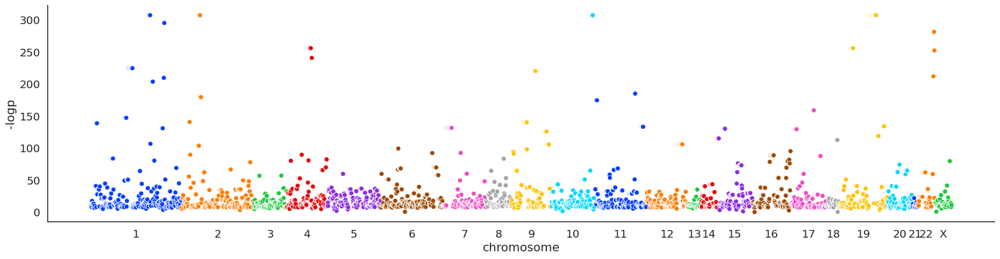

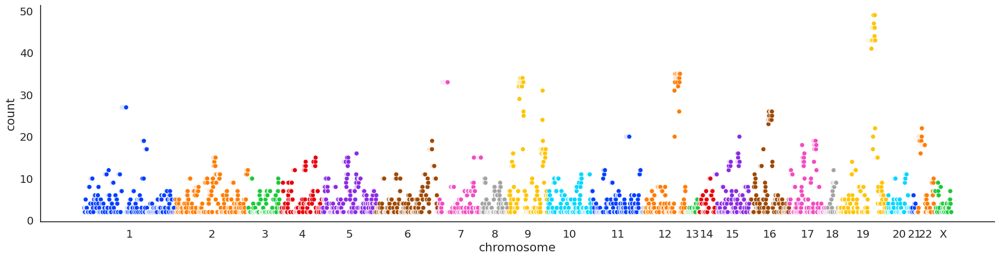

In [ ]:
# Followed this guidance for manhattan plots:
# https://github.com/mojones/video_notebooks/blob/master/Manhattan%20plots%20in%20Python.ipynb

import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import uniform, randint
#ignore pandas warnings
pd.options.mode.chained_assignment = None  # default='warn'

complete_df = pd.DataFrame()
sns.set_theme(font_scale=1.3, style='white')

for x in chromosomes:
    df = pd.read_csv(f"data/processed_data/chr_{x}_pvalue_clustered.csv")
    # count number of members in each cluster
    df_cluster_counts = df['ClusterId'].value_counts().reset_index()
    # Select the lowest p-value variant for each cluster
    filtered_df = df.groupby('ClusterId').apply(lambda x: x.loc[x['p_value'].idxmin()]).reset_index(drop=True)
    # count number of members in each cluster
    merged_df = filtered_df.merge(df_cluster_counts[['ClusterId', 'count']], how='left', on='ClusterId')
    #combine dfs
    complete_df = pd.concat([complete_df, merged_df], join="outer", ignore_index=True)


complete_df['-logp'] = -np.log10(complete_df.p_value)
complete_df = complete_df.sort_values(['chromosome','position'])
complete_df.reset_index(inplace=True, drop=True)
complete_df['i'] = complete_df.index

# Generate Manhattan plot: (#optional tweaks for relplot: linewidth=0, s=9)
plot = sns.relplot(data=complete_df, x='i', y='-logp', aspect=3.7,
                   hue='chromosome', palette = 'bright', legend=None)
chrom_df=complete_df.groupby('chromosome')['i'].median()
plot.ax.set_xlabel('chromosome')
plot.ax.set_xticks(chrom_df)
plot.ax.set_xticklabels(chrom_df.index)
#plot.fig.suptitle('Manhattan plot')

#save sns plot
plot.savefig("output/allchrs_log_pval_manhattan_plot.png")

# Repeat plot but with y-axis being number of members per cluster
complete_df['count'] = complete_df['count'].fillna(0)
complete_df['count'] = complete_df['count'].astype(int)

#plot
plot = sns.relplot(data=complete_df, x='i', y='count', aspect=3.7,
                   hue='chromosome', palette = 'bright', legend=None)
chrom_df=complete_df.groupby('chromosome')['i'].median()
plot.ax.set_xlabel('chromosome')
plot.ax.set_xticks(chrom_df)
plot.ax.set_xticklabels(chrom_df.index)
#plot.fig.suptitle('Manhattan plot of lead variant P-Values by chromosome')
# sns.set_theme(context='notebook', style='normal',
#               palette='deep', font='sans-serif', font_scale=1.2)
plot.savefig("output/allchrs_Members_manhattan_plot.png", dpi=300)


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



3167 variants in chromosome 1. VS filtered 561


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



2249 variants in chromosome 2. VS filtered 445


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



746 variants in chromosome 3. VS filtered 204


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



1298 variants in chromosome 4. VS filtered 248


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



1724 variants in chromosome 5. VS filtered 334


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



1972 variants in chromosome 6. VS filtered 382


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



2196 variants in chromosome 7. VS filtered 266
585 variants in chromosome 8. VS filtered 157


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



2496 variants in chromosome 9. VS filtered 248


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



1187 variants in chromosome 10. VS filtered 265


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



1643 variants in chromosome 11. VS filtered 323


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



1987 variants in chromosome 12. VS filtered 257
206 variants in chromosome 13. VS filtered 78


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



453 variants in chromosome 14. VS filtered 99


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



1243 variants in chromosome 15. VS filtered 217


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



1571 variants in chromosome 16. VS filtered 237


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



1356 variants in chromosome 17. VS filtered 228
327 variants in chromosome 18. VS filtered 77


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



3286 variants in chromosome 19. VS filtered 294


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



599 variants in chromosome 20. VS filtered 151
111 variants in chromosome 21. VS filtered 35


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



991 variants in chromosome 22. VS filtered 105


/tmp/ipykernel_469606/96967128.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



400 variants in chromosome X. VS filtered 104


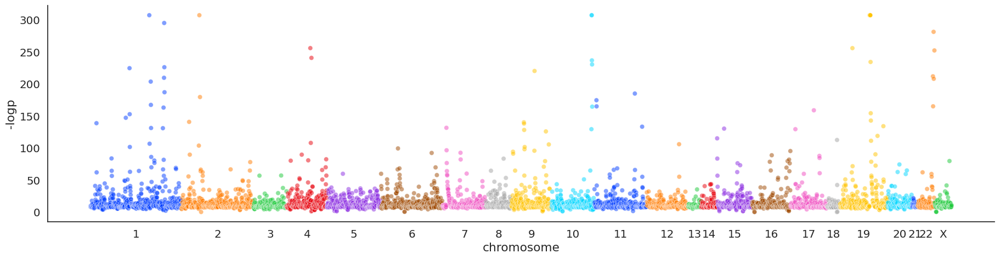

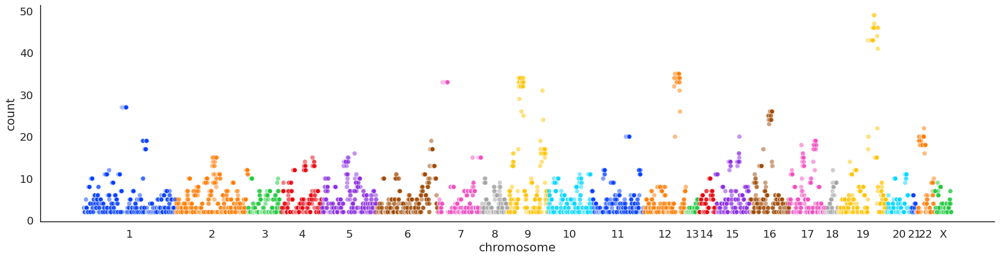

In [ ]:
# Manhattan Plot with the lead variant plotted.
# Followed this guidance for manhattan plots:
# https://github.com/mojones/video_notebooks/blob/master/Manhattan%20plots%20in%20Python.ipynb

import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import uniform, randint
#ignore pandas warnings
pd.options.mode.chained_assignment = None  # default='warn'
complete_df = pd.DataFrame()

for x in chromosomes:
    df = pd.read_csv(f"data/processed_data/chr_{x}_pvalue_clustered.csv")
    # count number of members in each cluster
    df_cluster_counts = df['ClusterId'].value_counts().reset_index()
    # Select the lowest p-value variant for each cluster
    filtered_df = df.groupby('ClusterId').apply(lambda x: x.loc[x['cluster_variant'] == True]).reset_index(drop=True)
    # count number of members in each cluster
    merged_df = filtered_df.merge(df_cluster_counts[['ClusterId', 'count']], how='left', on='ClusterId')
    #combine dfs
    complete_df = pd.concat([complete_df, merged_df], join="outer", ignore_index=True)
    print(f"{len(df)} variants in chromosome {x}. VS filtered {len(filtered_df)}")


complete_df['-logp'] = -np.log10(complete_df.p_value)
complete_df = complete_df.sort_values(['chromosome','position'])
complete_df.reset_index(inplace=True, drop=True)
complete_df['i'] = complete_df.index

# Generate Manhattan plot: (#optional tweaks for relplot: linewidth=0, s=9)
plot = sns.relplot(data=complete_df, x='i', y='-logp', aspect=3.7,
                   hue='chromosome', palette = 'bright', legend=None, alpha=0.5)
chrom_df=complete_df.groupby('chromosome')['i'].median()
plot.ax.set_xlabel('chromosome')
plot.ax.set_xticks(chrom_df)
plot.ax.set_xticklabels(chrom_df.index)
#plot.fig.suptitle('Manhattan plot')

#save sns plot
plot.savefig("output/allchrs_lead_var_log_pval_manhattan_plot.png")

# Repeat plot but with y-axis being number of members per cluster
complete_df['count'] = complete_df['count'].fillna(0)
complete_df['count'] = complete_df['count'].astype(int)

#plot
plot = sns.relplot(data=complete_df, x='i', y='count', aspect=3.7,
                   hue='chromosome', palette = 'bright', legend=None, alpha=0.5)
chrom_df=complete_df.groupby('chromosome')['i'].median()
# increase font size for axes

plot.ax.set_xlabel('chromosome')
plot.ax.set_xticks(chrom_df)
plot.ax.set_xticklabels(chrom_df.index)
#plot.fig.suptitle('Manhattan plot with number of members per cluster')
plot.savefig("output/allchrs_lead_var_Members_manhattan_plot.png")


/tmp/ipykernel_469606/339559481.py:23: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_469606/339559481.py:23: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_469606/339559481.py:23: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Ei

      Unnamed: 0.1  Unnamed: 0                                 studyId  \
3               16           3                  FINNGEN_R10_AUTOIMMUNE   
9               91          10                  FINNGEN_R10_E4_THYROID   
15             156          16                  FINNGEN_R10_M13_RHEUMA   
27             270          28       FINNGEN_R10_M13_POLYARTHROPATHIES   
41             379          45                  FINNGEN_R10_RHEUMA_NOS   
50             436          54            FINNGEN_R10_E4_THYTOXGOITDIF   
65             544          70          FINNGEN_R10_D3_ANAEMIA_B12_DEF   
78             622          83              FINNGEN_R10_THYROTOXICOSIS   
106            810         114        FINNGEN_R10_RX_RHEUMA_BIOLOGICAL   
108            840         116              FINNGEN_R10_RHEUMA_SERONEG   
111            877         119  FINNGEN_R10_AUTOIMMUNE_HYPERTHYROIDISM   
147           1084         160            FINNGEN_R10_H7_RETINALDISOTH   
150           1116         163        

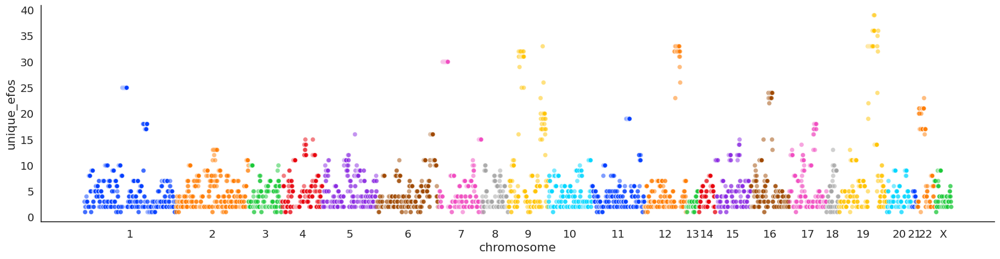

In [ ]:
# Manhattan plot for no. EFOs per cluster

# Manhattan Plot with the lead variant plotted.
# Followed this guidance for manhattan plots:
# https://github.com/mojones/video_notebooks/blob/master/Manhattan%20plots%20in%20Python.ipynb

import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import uniform, randint
#ignore pandas warnings
pd.options.mode.chained_assignment = None  # default='warn'

complete_df = pd.DataFrame()

# pvalue_efo_counts_by_variant

for x in chromosomes:
    df = pd.read_csv(f"data/processed_data/chr_{x}_pvalue_clustered_efo_counts.csv")
    # count number of members in each cluster
    df_cluster_counts = df['ClusterId'].value_counts().reset_index()
    # Select the lowest p-value variant for each cluster
    filtered_df = df.groupby('ClusterId').apply(lambda x: x.loc[x['cluster_variant'] == True]).reset_index(drop=True)
    # count number of members in each cluster
    merged_df = filtered_df.merge(df_cluster_counts[['ClusterId', 'count']], how='left', on='ClusterId')
    #combine dfs
    complete_df = pd.concat([complete_df, merged_df], join="outer", ignore_index=True)

# filter for rows with 25 unique efos
efo_25 = complete_df[complete_df['unique_efos'] == 25]
print(efo_25.head(30))

complete_df['-logp'] = -np.log10(complete_df.p_value)
complete_df = complete_df.sort_values(['chromosome','position'])
complete_df.reset_index(inplace=True, drop=True)
complete_df['i'] = complete_df.index

# Generate Manhattan plot: (#optional tweaks for relplot: linewidth=0, s=9)
plot = sns.relplot(data=complete_df, x='i', y='unique_efos', aspect=3.7,
                   hue='chromosome', palette = 'bright', legend=None, alpha=0.5)
chrom_df=complete_df.groupby('chromosome')['i'].median()
plot.ax.set_xlabel('chromosome')
plot.ax.set_xticks(chrom_df)
plot.ax.set_xticklabels(chrom_df.index)
plot.ax.set_ylabel('Number of Unique EFO IDs')
#plot.ax.set_title('Number of Unique EFO IDs per Cluster')
#plot.fig.suptitle('Manhattan plot of number of unique EFOs per cluster')

#save sns plot
plot.savefig("output/allchrs_lead_var_efo_counts_manhattan_plot.png")



In [ ]:
# # TODO: Clusters with no variants shouldn't exist as coloc with self should be present
# # TODO: Exclude variants once in a cluster

### Convert to matrix

In [ ]:
# Convert pandas dataframe to matrix
import numpy as np
from scipy.spatial.distance import pdist, squareform
print(coloc_pd_df.head())

# Create a dictionary to store matrices for each chromosome
print(chromosome)
chromosome_matrices = {}
chromosomes_to_analyse = [f'{chromosome}']
print(chromosomes_to_analyse)
# Iterate through each chromosome
for chr in chromosomes_to_analyse:
    # Filter DataFrame for the current chromosome
    coloc_pd_filtered_df = coloc_pd_df[coloc_pd_df['chromosome'] == chr]
    print(coloc_pd_filtered_df)
    # Get unique locus IDs
    unique_locus_ids = set(coloc_pd_filtered_df['leftStudyLocusId']).union(coloc_pd_filtered_df['rightStudyLocusId'])

    # Create a zero-filled matrix
    matrix = np.zeros((len(unique_locus_ids), len(unique_locus_ids)))

    # Create pairs of locus IDs
    pairs = coloc_pd_filtered_df[['leftStudyLocusId', 'rightStudyLocusId']].values
    print(pairs)
    # Iterate through pairs and update matrix
    for pair in pairs:
        row = np.where(np.array(list(unique_locus_ids)) == pair[0])[0][0]
        col = np.where(np.array(list(unique_locus_ids)) == pair[1])[0][0]
        matrix[row, col] = 1
        matrix[col, row] = 1
    for i in range(len(matrix)):
        matrix[i,i] = 1

# Store the matrix in the dictionary
chromosome_matrices[chromosome] = matrix
print(matrix)

#check total connections
total_ones = 0
# Iterate through the matrices in the dictionary
for matrix in chromosome_matrices.values():
    # Count the number of ones in the current matrix and add to the total
    total_ones += np.count_nonzero(matrix == 1)

# Print the total number of ones
print("Total number of ones in all matrices:", total_ones)
print(f"unique connections: {int(total_ones/2)}")
#check length of matrix matches unique locus ids
print(len(matrix))
print(len(unique_locus_ids))

# Assuming you have a matrix named 'matrix'
distance_matrix = matrix - 1
print(distance_matrix)

# Assuming you have a data matrix called 'data'
# Calculate the pairwise distances between the data points
distances = pdist(matrix)

# Convert the pairwise distances to a square distance matrix
distance_matrix = squareform(distances)

# Print the distance matrix
print(distance_matrix)



  chromosome     leftStudyLocusId    rightStudyLocusId  \
0          1 -7739811754326032609 -8580726767903703361   
1          1 -7180920194711895424 -8803538001521518159   
2          1 -7145299275585606737 -8780263499383943526   
3          1 -6982916822936356932 -8404678411441676549   
4          1 -6976441487811867207 -9003725253470911662   

   numberColocalisingVariants            h0            h1            h2  \
0                           9  1.982277e-12  1.341592e-10  3.353874e-04   
1                           2  1.445687e-14  9.711416e-10  2.300574e-08   
2                           9  2.214284e-13  2.477526e-10  8.790068e-06   
3                           3  5.869043e-15  2.295631e-06  7.678875e-12   
4                           5  2.482528e-42  9.714654e-35  3.752589e-11   

         h3        h4   log2h4h3 colocalisationMethod  
0  0.021721  0.977944   5.492599                COLOC  
1  0.000546  0.999454  10.838132                COLOC  
2  0.008844  0.991147   6.808270

NameError: name 'chromosome' is not defined

In [ ]:
# plot logp values for each cluster vs number of members
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Load the data
#
# complete_df

print(complete_df.head())
print(complete_df.columns)

# select only clusters with cluster_variant == True
complete_filtered_df = complete_df[complete_df['cluster_variant'] == True]

# Create the scatter plot
fig = px.scatter(complete_filtered_df,
                 x='count',
                 y='-logp',
                 hover_name='ClusterId',  # Show ClusterId on hover
                 #size='count',            # Size bubbles proportionally to count
                 title='-logP vs. Number of Members in Cluster',
                )

# Customize appearance (optional)
fig.update_traces(marker=dict(color='blue'))  # Change marker color
fig.update_layout(xaxis_title='Number of Members in Cluster',
                  yaxis_title='Mean -logP')

fig.show()
plotly.offline.plot(fig, filename=f'logp_vs_members_per_cluster.html')


   Unnamed: 0.1  Unnamed: 0                        studyId  \
0          2793         587        FINNGEN_R10_K11_KELAIBD   
1          2055         369   FINNGEN_R10_M13_HALLUXVALGUS   
2          2300         431         FINNGEN_R10_K11_HERNIA   
3          2425         465  FINNGEN_R10_M13_ARTHROSIS_OTH   
4          2768         567      FINNGEN_R10_M13_ARTHROSIS   

          studyLocusId      variantId chromosome  position  \
0  7470347575360623352  1_1308516_C_T          1   1308516   
1 -8332366130301194545  1_1309988_G_A          1   1309988   
2 -3766852088898489923  1_1313807_G_A          1   1313807   
3  7070712290760110381  1_1743238_G_C          1   1743238   
4  7641466448665579091  1_1743238_G_C          1   1743238   

                region      beta  zScore  ...  analysisFlags  \
0       chr1:0-2808516 -0.097508     NaN  ...            NaN   
1       chr1:0-2809988 -0.088808     NaN  ...            NaN   
2       chr1:0-2813807 -0.045162     NaN  ...            NaN  

'logp_vs_members_per_cluster.html'

In [1]:
# Count number of clusters and singletons in each chromosome vs total number of study loci

# Load the data
summary_df = pd.read_csv("data/processed_data/summary_df.csv")
print(summary_df.head())
# count number of clusters and singletons in each chromosome
# add all rows of total variants to a single int
total_variants = summary_df['total_variants'].sum()
print(total_variants)
# Number of CS after filter.
#print(significant_coloc.df.count()) # 32429
# Find number of unqiue SL in significant_coloc
#unique_sl = significant_coloc.df.select('leftStudyLocusId').union(significant_coloc.df.select('rightStudyLocusId')).distinct().count()
#print(unique_sl)

NameError: name 'pd' is not defined

#### Cluster the matrix

In [ ]:
import numpy as np
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import fcluster
#cliuster distance matrix with ward heirarchical clustering
import matplotlib.pyplot as plt

# Perform hierarchical clustering

# linkage requires a condensed distance matrix
# The `scipy.cluster.hierarchy.linkage` function expects
# a condensed distance matrix as input.
# A condensed distance matrix is a flat array
# containing the upper triangular of the distance matrix.
# It's used to save space and avoid redundancy since a distance matrix is symmetric,
# with the diagonal elements being zero (indicating that the distance of an element to itself is zero).

from scipy.spatial.distance import squareform

# Convert the full distance matrix to a condensed one
condensed_distance_matrix = squareform(distance_matrix)
print(distance_matrix.shape)

# Perform hierarchical clustering
Z = hierarchy.linkage(condensed_distance_matrix, method='average')
print(type(Z))
print(Z)
print(Z.shape)
print(Z[0])
# Plot the dendrogram
#plt.figure(figsize=(20, 10))
#dn = hierarchy.dendrogram(Z)
#plt.xlabel('Samples')
#plt.ylabel('Distance')
#plt.title('Hierarchical Clustering Dendrogram')

# Get the clusters list

# Set the threshold to determine the number of clusters
# threshold = 10
# threshold = 5
# threshold = 3 # 67 clusters
#threshold = 1 # 368 clusters
#threshold = 0.5 # 407 clusters
threshold = 0.1 # 407 clusters

# Extract the clusters
clusters = fcluster(Z, threshold, criterion='distance')
print(type(clusters))
print(clusters)
print(clusters.shape)

# get list of locus ids unique
locus_ids = list(unique_locus_ids)
print(locus_ids)
print(len(locus_ids))
clustered_locus_ids = {}
# Iterate over unique cluster labels
for label in np.unique(clusters):
    # Get the indices of locus IDs in the current cluster
    indices = np.where(clusters == label)[0]
    print(indices)
    # Get the corresponding locus IDs from locus_ids list
    clustered_locus_ids[label] = [locus_ids[i] for i in indices]

# Print the clustered locus IDs
print("Clustered Locus IDs:")
for cluster_label, ids in clustered_locus_ids.items():
    print(f"Cluster {cluster_label}: {ids}")



(1012, 1012)
<class 'numpy.ndarray'>
[[0.00000000e+00 2.16000000e+02 0.00000000e+00 2.00000000e+00]
 [1.00000000e+00 1.40000000e+01 0.00000000e+00 2.00000000e+00]
 [2.00000000e+00 1.36000000e+02 0.00000000e+00 2.00000000e+00]
 ...
 [1.71600000e+03 2.01900000e+03 4.95284021e+00 9.41000000e+02]
 [2.01000000e+03 2.02000000e+03 5.26061658e+00 9.66000000e+02]
 [1.68400000e+03 2.02100000e+03 7.22210253e+00 1.01200000e+03]]
(1011, 4)
[  0. 216.   0.   2.]
<class 'numpy.ndarray'>
[326   1  70 ...  42 222  98]
(1012,)
[-2946753760867706877, -2005905860258365438, -5361463818512240636, -1587769186011760637, -3129970084035629049, 2401858320088500226, -6792670109632946166, 622425396178407438, 3922381209484781581, 3816807747106412559, 7407661712400314382, -795787483467108333, 4048635216261998616, -699269671455746016, 1768806930387550240, 3395509044926773280, -8235189059513282523, 4175189434935320611, 902312221484398629, 3315223905179172902, 2409010969253664809, -4220883002534948811, 2870628938573400

#### Collect cluster information from extracted df, create new df for each cluster with information attached.

In [ ]:

import matplotlib.pyplot as plt
import pandas as pd
import pprint
import itertools

def flatten_list(nested_list):
    return list(itertools.chain(*nested_list))


# Get the locus ids for each cluster
#clustered_locus_ids = clustered_locus_ids.values()
print(filtered_df.columns)
cluster_efos = []
# Iterate over each cluster
dict = {}
for cluster_id, locus_ids in clustered_locus_ids.items():
    # Filter the study locus table for the current cluster
    extracted_df = filtered_df.filter(filtered_df['studyLocusId'].isin(locus_ids))
    #extracted_df.show(5)
    # study_index_df_filtered = filtered_df.filter(filtered_df['studyLocusId'].isin(locus_ids))
    # count number of EFOs
    unqiue_EFOs = extracted_df.select('traitFromSourceMappedIds').distinct().count()

    traits = [row['traitFromSourceMappedIds'] for row in extracted_df.select('traitFromSourceMappedIds').distinct().collect()]
    traits_unique = set(flatten_list(traits))
    betas = [row[0] for row in extracted_df.select('beta').collect()]
    avg_beta = extracted_df.select('beta').agg({'beta': 'avg'}).first()[0]
    # chr = extracted_df.select('chromosome').distinct().collect()[0][0]

    dict = {
        'cluster_id': cluster_id,
        'locus_ids': locus_ids,
        'unique_efos': unqiue_EFOs,
        'all_efos': traits_unique,
        'beta': betas,
        'average_beta': avg_beta,
        'size': len(locus_ids),
        'size_efos': len(traits_unique),
    }
    cluster_efos.append(dict)

pprint.pprint(cluster_efos)

['studyId', 'studyLocusId', 'variantId', 'chromosome', 'position', 'region', 'beta', 'zScore', 'pValueMantissa', 'pValueExponent', 'effectAlleleFrequencyFromSource', 'standardError', 'subStudyDescription', 'qualityControls', 'finemappingMethod', 'credibleSetIndex', 'credibleSetlog10BF', 'purityMeanR2', 'purityMinR2', 'sampleSize', 'ldSet', 'locus', 'projectId', 'studyType', 'traitFromSource', 'traitFromSourceMappedIds', 'geneId', 'tissueFromSourceId', 'pubmedId', 'publicationTitle', 'publicationFirstAuthor', 'publicationDate', 'publicationJournal', 'backgroundTraitFromSourceMappedIds', 'initialSampleSize', 'nCases', 'nControls', 'nSamples', 'cohorts', 'ldPopulationStructure', 'discoverySamples', 'replicationSamples', 'qualityControls', 'analysisFlags', 'summarystatsLocation', 'hasSumstats']


[{'all_efos': {'EFO_0000319',
               'EFO_0000337',
               'EFO_0000398',
               'EFO_0000685',
               'EFO_0000734',
               'EFO_0002609',
               'EFO_0003839',
               'EFO_0004237',
               'EFO_0004283',
               'EFO_0005140',
               'EFO_0005755',
               'EFO_0005856',
               'EFO_0006812',
               'EFO_0009190',
               'EFO_0009406',
               'EFO_0009460',
               'EFO_0009605',
               'EFO_0009664',
               'EFO_1000627',
               'EFO_1001986',
               'GO_0042493',
               'HP_0003040',
               'MONDO_0001898',
               'MONDO_0002280',
               'Orphanet_442'},
  'average_beta': -0.08430977407407408,
  'beta': [-0.228059,
           -0.187473,
           -0.230541,
           0.388795,
           -0.355788,
           -0.239296,
           -0.349155,
           -0.125096,
           -0.120346,
         

#### Plotting clusters for EFOs

In [ ]:
import plotly.graph_objects as go
import plotly

# Extract cluster ids, locus_ids, and unique efos from the dictionary
cluster_ids = [x['cluster_id'] for x in cluster_efos]  # cluster_efos['cluster_id']
locus_ids = [x['locus_ids'] for x in cluster_efos]
unique_efos = [x['unique_efos'] for x in cluster_efos]

# old code to get cluster ids, locus ids and unique efos, from dict no longer present
# locus_ids = cluster_efos['locus_ids']
# unique_efos = cluster_efos['unique_efos']

# # Inspect single cluster
# cluster_id = cluster_efos[0]['cluster_id']
# locus_ids = cluster_efos[0]['locus_ids']
# unique_efos = cluster_efos[0]['unique_efos']

# Create a list of cluster labels for the x-axis
cluster_labels = [f'Cluster {i}'for i in range(1, max(cluster_ids) + 1)]

# Create a list of efos for the y-axis
efos = [unique_efos] * cluster_id
df_efos = pd.DataFrame(cluster_efos)
# Create a bar plot using Plotly
fig = go.Figure(data=[go.Bar(x=df_efos['cluster_id'], y=df_efos['unique_efos'])])
# hover text
fig.update_traces(text=df_efos['unique_efos'], textposition='outside')
fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.7)
#change hover text with cluster id
fig.update_traces(hoverinfo='text')
# labels for x and y axis
fig.update_layout(title=f'EFOS for Each Cluster in Chr{chromosome}', xaxis_title='Cluster', yaxis_title='EFOS')


# Display the plot
fig.show()

# Save the plot to an HTML file
from datetime import datetime
date = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
#plotly.offline.plot(fig, filename='cluster_efos.html')
plotly.offline.plot(fig, filename=f'Chr_{chr}_cluster_efos_{date}.html')

# TODO: ZEROs why?? find out why there are zeros in the matrix

'Chr_1_cluster_efos_2024-06-20_09-56-25.html'

### Investigate cluster 1 in CHR1 with EFOs of 23.

In [ ]:
cluster_efos_df = pd.DataFrame(cluster_efos)
print(cluster_efos_df.columns)
cluster_1_df = cluster_efos_df[cluster_efos_df['cluster_id'] == 1]
print(cluster_1_df)
print(list(cluster_1_df['all_efos']))

Index(['cluster_id', 'locus_ids', 'unique_efos', 'all_efos', 'beta',
       'average_beta', 'size', 'size_efos'],
      dtype='object')
   cluster_id                                          locus_ids  unique_efos  \
0           1  [-2005905860258365438, 1768806930387550240, 50...           23   

                                            all_efos  \
0  {EFO_0009406, GO_0042493, EFO_0004237, HP_0003...   

                                                beta  average_beta  size  \
0  [-0.228059, -0.187473, -0.230541, 0.388795, -0...      -0.08431    46   

   size_efos  
0         25  
[{'EFO_0009406', 'GO_0042493', 'EFO_0004237', 'HP_0003040', 'EFO_0005755', 'EFO_0000734', 'EFO_0000337', 'EFO_0000398', 'Orphanet_442', 'EFO_1000627', 'MONDO_0002280', 'EFO_0000319', 'EFO_0003839', 'EFO_0000685', 'EFO_0009460', 'MONDO_0001898', 'EFO_0002609', 'EFO_0005856', 'EFO_1001986', 'EFO_0004283', 'EFO_0009605', 'EFO_0005140', 'EFO_0006812', 'EFO_0009664', 'EFO_0009190'}]


### Eigen Values

In [ ]:
# Find the Eigen values
import numpy as np
import numpy as np
from sklearn.decomposition import PCA

print(min(np.linalg.eigvalsh(distance_matrix)))
print(max(np.linalg.eigvalsh(distance_matrix)))
print(len(np.linalg.eigvalsh(distance_matrix)))
print(sum(np.linalg.eigvalsh(distance_matrix))/len(np.linalg.eigvalsh(distance_matrix)))

negative_count = np.sum(np.linalg.eigvalsh(distance_matrix) < 0)
print(negative_count)

# Eigenvalues are a set of scalars associated with a linear system of equations.
# They represent the values by which a matrix can be scaled without changing
# the direction of its corresponding eigenvectors.
# In other words, eigenvalues determine the stretching or compression factor
# of the eigenvectors in a linear transformation.
# They are often used in various mathematical and scientific applications,
# such as solving differential equations, analyzing network structures,
# and performing dimensionality reduction techniques
# like Principal Component Analysis (PCA).


eigenvalues, eigenvectors = np.linalg.eig(distance_matrix)
print(eigenvalues)
max_eigenvalue = max(eigenvalues)
min_eigenvalue = min(eigenvalues)
print("Max Eigenvalue:", max_eigenvalue)
print("Min Eigenvalue:", min_eigenvalue)



-662.2453658562708
3956.4022188363138
1012
4.49355089808759e-15
668
[ 3.95640222e+03+0.00000000e+00j -6.62245366e+02+0.00000000e+00j
 -1.99515412e+02+0.00000000e+00j ... -4.55799823e-34+0.00000000e+00j
 -4.70875858e-18+2.37755342e-18j -4.70875858e-18-2.37755342e-18j]
Max Eigenvalue: (3956.402218836313+0j)
Min Eigenvalue: (-662.2453658562744+0j)


### PCA plot for distance matrix

Reduced Matrix:
Explained Variance Ratio:
[0.86076508 0.05905489]
Principal Components:


/home/rswilson1/anaconda3/envs/py310/lib/python3.10/site-packages/matplotlib/cbook.py:1762: ComplexWarning:

Casting complex values to real discards the imaginary part

/home/rswilson1/anaconda3/envs/py310/lib/python3.10/site-packages/matplotlib/collections.py:197: ComplexWarning:

Casting complex values to real discards the imaginary part



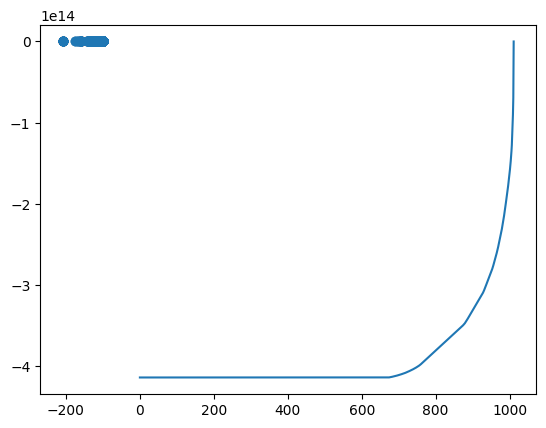

In [ ]:
import plotly.express as px

# Create a PCA object
pca = PCA(n_components=2)  # Specify the number of components you want to keep

# Fit the PCA model to the matrix
pca.fit(distance_matrix)

#2D explained variance plot
components = pca.fit_transform(distance_matrix)
fig = px.scatter(components, x=0, y=1)
fig.show()
plotly.offline.plot(fig, filename=f'Chr_{chr}_PCA_{date}.html')


# Transform the matrix to the reduced dimensionality
reduced_matrix = pca.transform(distance_matrix)

# Access the explained variance ratio of each component
explained_variance_ratio = pca.explained_variance_ratio_

# Access the principal components
principal_components = pca.components_

# Print the results
print("Reduced Matrix:")
# print(reduced_matrix)
print("Explained Variance Ratio:")
print(explained_variance_ratio)
print("Principal Components:")
# print(principal_components)

order_of_importance = np.argsort(eigenvalues)[::-1]

# utilize the sort order to sort eigenvalues and eigenvectors
sorted_eigenvalues = eigenvalues[order_of_importance]
sorted_eigenvectors = eigenvectors[:,order_of_importance] # sort the columns

# explained_variance
explained_variance = sorted_eigenvalues / np.sum(sorted_eigenvalues)

k = 2 # select the number of principal components
reduced_data = np.matmul(distance_matrix, sorted_eigenvectors[:,:k]) # transform the original data

#plot scatter plot of reduced data
plt.scatter(reduced_data[:,0], reduced_data[:,1], alpha=0.3)

#plot the explained variance
import matplotlib.pyplot as plt
plt.plot(np.cumsum(explained_variance))

##### Heatmap

In [ ]:
import numpy as np
import plotly.express as px

# # Create the heatmap
# sns.heatmap(distance_matrix, annot=True, cmap="YlGnBu")

# # Add labels and title (optional)
# plt.xlabel("X-axis Label")
# plt.ylabel("Y-axis Label")
# plt.title("Heatmap of Your Matrix")

# # Show the plot
# plt.show()

fig = px.imshow(distance_matrix, text_auto=True)
fig.show()
plotly.offline.plot(fig, filename=f'Chr_{chr}_heatmap_{date}.html')

'Chr_1_heatmap_2024-06-20_09-56-25.html'

### Old code - redundant

In [ ]:
## Plotting cluster data (created by P-Value)
#
#print(pvalue_cluster_df.head(5))
## Summarise data group by cluster and count number of EFOs in each cluster
#cluster_df = pvalue_cluster_df.groupby('ClusterId').agg(
#    no_EFO_ids=('unique_efos', 'sum')).reset_index()
#
## Plot the number of EFOs in each cluster
## Create a bar plot using Plotly
#fig = go.Figure(data=[go.Bar(x=cluster_df['ClusterId'], y=cluster_df['unique_efos'])])
## hover text
#fig.update_traces(text=cluster_df['unique_efos'], textposition='outside')
#fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
#                  marker_line_width=1.5, opacity=0.7)
## change hover text with cluster id
#fig.update_traces(hoverinfo='text')
## labels for x and y axis
#fig.update_layout(title='EFOS for Each Cluster', xaxis_title='Cluster', yaxis_title='EFOS')
## Display the plot
#from datetime import datetime
#date = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
#plotly.offline.plot(fig, filename=f'cluster_efos_pvalue_{date}.html')

In [ ]:
    # for _, matching_row in coloc_results.iterrows():
    #     if matching_row["leftStudyLocusId"] == variant_id:
    #         matching_id = matching_row["rightStudyLocusId"]
    #         collected_variants.add(matching_id)
    #     elif matching_row["rightStudyLocusId"] == variant_id:
    #         matching_id = matching_row["leftStudyLocusId"]
    #         collected_variants.add(matching_id)
    #     else:
    #         raise ValueError("Matching ID not found.")
    #     # Calculate unique EFOs
    #     unique_efos = set(row["traitFromSourceMappedIds"]).union(
    #         set(matching_row["traitFromSourceMappedIds"]))

#### Find the overlap between study ids

In [ ]:
#Overlap
from pyspark.sql import functions as f

# Assuming you have loaded your study locus data into a DataFrame called `filtered_df`

# Create a new DataFrame with columns for study ID, locus ID, and genomic region
overlap_df = filtered_df.select(
    "studyId", "studyLocusId", f.col("region").alias("region_overlap")
)

# Perform a self-join on the 'region_overlap' column to find overlaps
overlap_df = overlap_df.join(
    overlap_df.withColumnRenamed("studyId", "studyId2")
               .withColumnRenamed("studyLocusId", "studyLocusId2"),
    on="region_overlap",
    how="inner",
)

# Filter out self-overlaps (where studyId and studyId2 are the same)
overlap_df = overlap_df.filter(f.col("studyId") != f.col("studyId2"))

# Show the resulting overlaps
overlap_df.show()

+--------------------+--------------------+--------------------+--------------------+--------------------+
|      region_overlap|             studyId|        studyLocusId|            studyId2|       studyLocusId2|
+--------------------+--------------------+--------------------+--------------------+--------------------+
|chr1:155334816-15...|FINNGEN_R10_AUTOI...|-7473388533756303748|FINNGEN_R10_E4_TH...| 7418982858853793694|
|chr15:71884923-74...|   FINNGEN_R10_I9_AF|  855919497827592708|FINNGEN_R10_I9_AF...| -407760862247234193|
|chr15:71884923-74...|   FINNGEN_R10_I9_AF|  311170493871054124|FINNGEN_R10_I9_AF...| -407760862247234193|
|chr15:71884923-74...|FINNGEN_R10_I9_AF...| 1984446793499158275|   FINNGEN_R10_I9_AF|  311170493871054124|
|chr15:71884923-74...|FINNGEN_R10_I9_AF...| -407760862247234193|   FINNGEN_R10_I9_AF|  311170493871054124|
|chr17:47861940-50...|FINNGEN_R10_L12_D...|-1188804432879290119|FINNGEN_R10_L12_A...|  116240658289828678|
|chr1:176425456-17...|FINNGEN_R10_E4_

Index(['Unnamed: 0.1', 'Unnamed: 0', 'studyId', 'studyLocusId', 'variantId',
       'chromosome', 'position', 'region', 'beta', 'zScore', 'pValueMantissa',
       'pValueExponent', 'effectAlleleFrequencyFromSource', 'standardError',
       'subStudyDescription', 'qualityControls', 'finemappingMethod',
       'credibleSetIndex', 'credibleSetlog10BF', 'purityMeanR2', 'purityMinR2',
       'sampleSize', 'ldSet', 'locus', 'projectId', 'studyType',
       'traitFromSource', 'traitFromSourceMappedIds', 'geneId',
       'tissueFromSourceId', 'pubmedId', 'publicationTitle',
       'publicationFirstAuthor', 'publicationDate', 'publicationJournal',
       'backgroundTraitFromSourceMappedIds', 'initialSampleSize', 'nCases',
       'nControls', 'nSamples', 'cohorts', 'ldPopulationStructure',
       'discoverySamples', 'replicationSamples', 'qualityControls.1',
       'analysisFlags', 'summarystatsLocation', 'hasSumstats', 'p_value',
       'ClusterId'],
      dtype='object')
   Unnamed: 0.1  Unnam

/tmp/ipykernel_420219/2414831364.py:19: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

/tmp/ipykernel_420219/2414831364.py:37: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



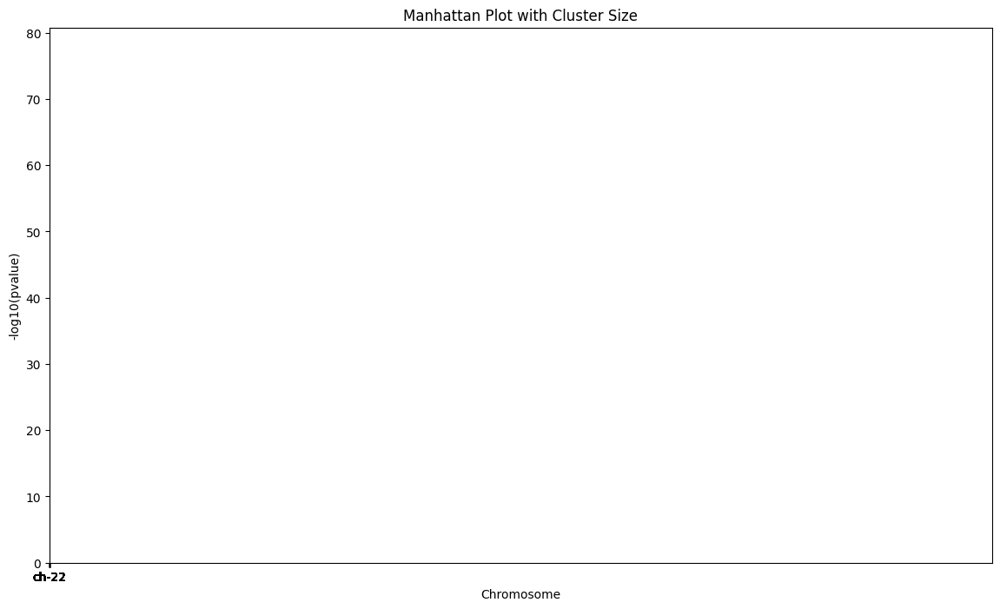

In [ ]:
#from pandas import DataFrame
#import matplotlib.pyplot as plt
#
#for x in chromosomes:
#    df = pd.read_csv(f"data/processed_data/chr_{x}_pvalue_clustered.csv")
#    #combine dfs
#    pd.concat([df, df], axis=0, join="outer")
#
#for x in chromosomes:
#    if x == 1:
#        #import df
#        # df = pd.read_csv(f"data/processed_data/chr_{x}_pvalue_clustered.csv")
#        # find lead variants and count number of members in cluster
#        # use apply to filter lowest pvalue row for each cluster
#        print(df.columns)
#        # count number of members in each cluster
#        df_cluster_counts = df['ClusterId'].value_counts().reset_index()
#        filtered_df = df.groupby('ClusterId').apply(lambda x: x.loc[x['p_value'].idxmin()]).reset_index(drop=True)
#        # count number of members in each cluster
#        merged_df = filtered_df.merge(df_cluster_counts[['ClusterId', 'count']], how='left', on='ClusterId')
#        print(merged_df.head())
#        print(merged_df.columns)
#        #Calculate -log10(pvalue)
#        merged_df['minuslog10pvalue'] = -np.log10(merged_df['p_value'])
#        #rename chromosome column
#        merged_df.rename(columns={'chromosome': 'chr'}, inplace=True)
#
#        #Convert chr to category
#        merged_df.chr = merged_df.chr.astype('category')
#        merged_df.chr = merged_df.chr.cat.set_categories(['ch-%i' % i for i in range(1, 23)], ordered=True)
#        merged_df = merged_df.sort_values('chr')
#
#        #Calculate index to have non-overlapping points on the x-axis
#        print(range(len(merged_df)))
#        merged_df['ind'] = range(len(merged_df))
#        df_grouped = merged_df.groupby(('chr'))
#
#        #Create Manhattan Plot
#        fig = plt.figure(figsize=(14, 8)) #Set the figure size
#        ax = fig.add_subplot(111)
#        colors = ['darkred','darkgreen','darkblue', 'gold']
#        x_labels = []
#        x_labels_pos = []
#        for num, (name, group) in enumerate(df_grouped):
#            group.plot(kind='scatter', x='ind', y='minuslog10pvalue',color=colors[num % len(colors)], ax=ax, s=group['count']*10)  # Point size scaled by count
#            x_labels.append(name)
#            x_labels_pos.append((group['ind'].iloc[-1] - (group['ind'].iloc[-1] - group['ind'].iloc[0])/2) if len(group) > 0 else 0)
#            # x_labels_pos.append((group['ind'].iloc[-1] - (group['ind'].iloc[-1] - group['ind'].iloc[0])/2))
#
#        #Formatting
#        ax.set_xticks(x_labels_pos)
#        ax.set_xticklabels(x_labels, rotation=0, ha='center')
#        ax.set_xlim([0, len(merged_df)])
#        ax.set_ylim([0, merged_df['minuslog10pvalue'].max() + 1]) # Adjust y-axis limit based on your data
#        ax.set_xlabel('Chromosome')
#        ax.set_ylabel('-log10(pvalue)')
#        plt.title('Manhattan Plot with Cluster Size')
#        plt.show()
#